**Импортируем библиотеки**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px 
import folium
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

# 1

**Считываем данные**

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

**Ознакамливаемся с данными**

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**Смотрим общую информацию**

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.shape

(8406, 14)

**В датасете представлены 8406 записей, в них 16 столбцов. Количество названий заведений совпадает с количеством записей, заведений - 8406. Названия столбцов написаны корректно, нет смысла изменять. Можно изменить тип данных на целое число в столбцах со средним чеком, средней ценой за чашку кофе и с колчисетвом посадочных мест** 

# 2

In [6]:
len(data['name'].unique())

5614

**В датасете представлено 8406 заведений, уникальных которых 5614 (оставшиеся являются сетями)**

In [7]:
data.duplicated().sum()

0

In [73]:
data[['name', 'address']].duplicated().sum()

0

В данных нет явных дубликатов

In [8]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Заменим пропуски в типе object на unknown

In [9]:
data['avg_bill'] = data['avg_bill'].fillna('unknown')

In [10]:
data['price'] = data['price'].fillna('unknown')

In [11]:
data['hours'] = data['hours'].fillna('unknown')

<AxesSubplot:>

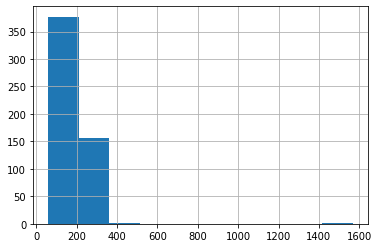

In [12]:
data['middle_coffee_cup'].hist()

На гистограмме виден выброс, вряд ли средняя цена кофе больше 1000 рублей. Посмотрим сколько в датасете значений больше 300 рублей.

In [13]:
data[data['middle_coffee_cup'] > 300]['name'].count()

6

Таких значений всего 6, но заниматься ими мы будем когда будем рассматривать конкретно кофейни, на промежуточные результаты это не повлияет.

In [14]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

с пропусками в столбце со средней ценой за чашку мы поработаем в последнем пункте, в столбце со средним чеком, очень много пропусков и если мы заполним пропуски средним или медианным значением по другим параметрам мы раскрасим все одной краской.

-----

* Прописываем функцию для присвоения True или False в новый столбец, обозначающий статус круглосуточного заведения

In [15]:
def clock(info):
    try:
        if 'круглосуточно' in info and 'ежедневно' in info:
            return True
        else:
            return False
    except:
        pass
    
    
data['is_24/7'] = data['hours'].apply(clock)

* Прописываем функцию, которая вернет из полного адреса только название улицы в новый стоблец и применим ее к столбцу с адерсом

In [16]:
def get_street(address):
    street = address.split(', ')
    return street[1]
    
data['street'] = data['address'].apply(get_street)

In [17]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,NaN,NaN,0,NaN,False,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,False,Правобережная улица


# 3

* **Посмотрим какие категории заведений представлены в данных**

In [18]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

**Построим гистограмму по частоте категорий**

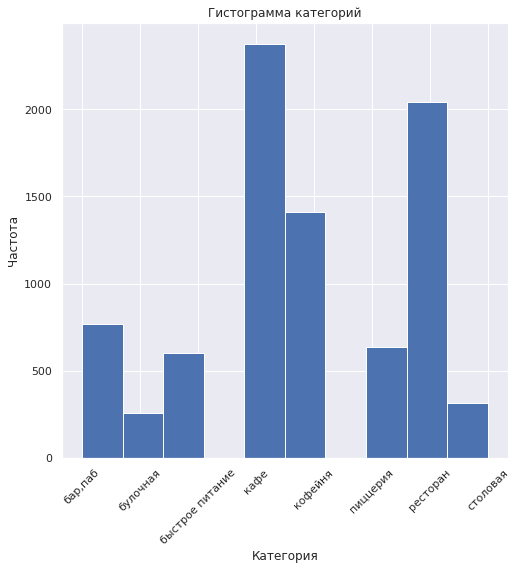

In [19]:
sns.set(rc={'figure.figsize':(8,8)})
data['category'].sort_values().hist()
plt.title('Гистограмма категорий')
plt.xlabel('Категория')
plt.ylabel('Частота')
plt.xticks(rotation=45);

**Гистограмма показывает, что в данных больше всего: кафе, кофеен, ресторанов. Меньше всего булочных**

----

* **Построим график - скрипку, чтобы проанализировать количество посадочных мест по категориям.**

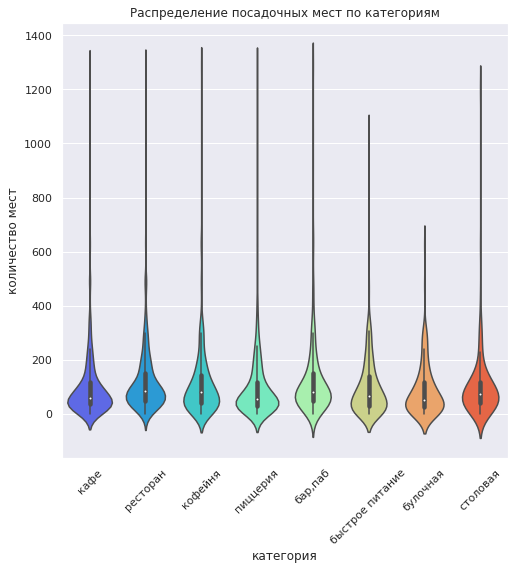

In [20]:
sns.violinplot(x='category', y='seats', data=data, palette='rainbow')
plt.title('Распределение посадочных мест по категориям')
plt.xlabel('категория')
plt.ylabel('количество мест')
plt.xticks(rotation=45);

**На графике есть длинные "хвосты", которые сигнализируют о выбросах. В нескольких категориях они свыше 1300. Вероятнее всего, это связано с тем, что некоторые заведения находятся на фудкортах (например в торговом центре) с большим количеством мест. Для подробного рассмотрения основной части данных, отсечем "хвосты" (сделаем срез)**

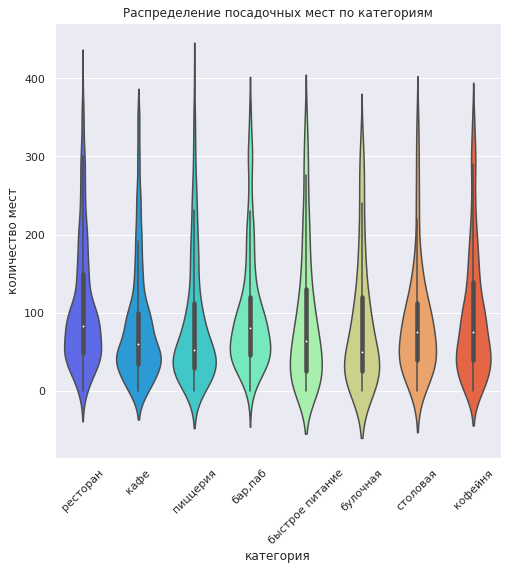

In [21]:
sns.violinplot(x='category', y='seats', data=data[data['seats'] < 400], palette='rainbow')
plt.title('Распределение посадочных мест по категориям')
plt.xlabel('категория')
plt.ylabel('количество мест')
plt.xticks(rotation=45);

**На графике видно, что медианное значение по количеству посадочных мест почти во всех категориях, находится в районе 50-80, Так же мы можем наблюдать, что бОльшая доля данных для всех категорий находится в диапозоне от 0-300 посадочных мест.**

---

**Построим гистограмму отображающую количество сетевых и несетевых заведений**

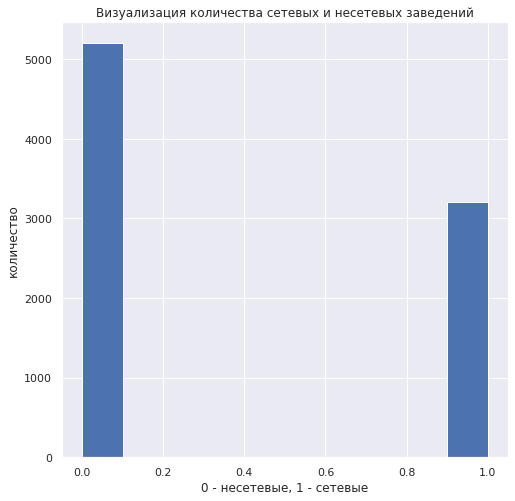

In [22]:
data['chain'].hist()
plt.title('Визуализация количества сетевых и несетевых заведений')
plt.xlabel('0 - несетевые, 1 - сетевые')
plt.ylabel('количество');

**Несетевых заведений больше, их в датасете чуть больше 5000, сетевых ~ 3250**

----

**Построим столбчатую диаграмму отображающую количество сетевых заведений по категориям**

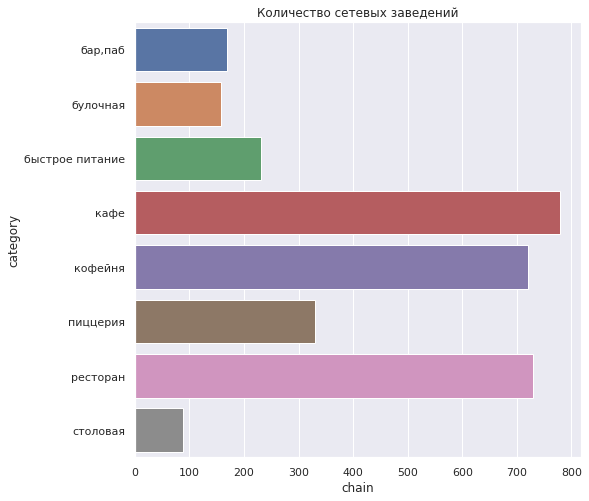

In [23]:
data_chain_rate = data.groupby('category', as_index=False).agg({'chain': 'sum'})
sns.barplot(data=data_chain_rate, x='chain', y='category')
plt.title('Количество сетевых заведений');

**Самыми "сетевыми" категориями являются кафе, кофейни и рестораны. Самым "несетевым" является столовая.**

----

**Построим таблицу топ 15-ти заведений из датасета с их категорией.**

In [24]:
chains_all = data.query('chain == 1')
top15 = chains_all.groupby(['name', 'category']).agg({'name': ['count']}).reset_index()
top15.columns=['name', 'category', 'cnt']
top15 = top15.sort_values(by='cnt', ascending=False).head(15).reset_index(drop=True)
top15

,name,category,cnt
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


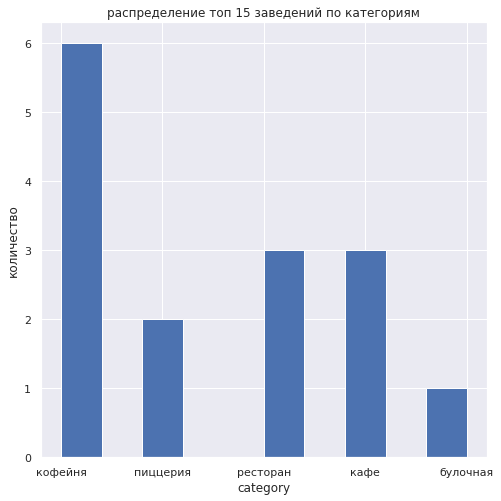

In [25]:
top15['category'].hist()
plt.title('распределение топ 15 заведений по категориям')
plt.xlabel('category')
plt.ylabel('количество');

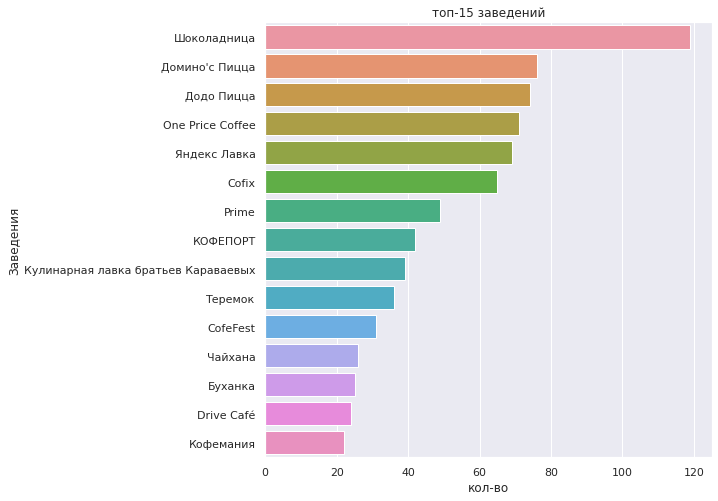

In [26]:
sns.barplot(data=top15, x='cnt', y='name')
plt.title('топ-15 заведений')
plt.xlabel('кол-во')
plt.ylabel('Заведения');

1) **Не удивительно, что Шоколоданица, яыляется самым популярным заведением из датасета, она есть почти в каждом тц.**

2) **Доминос пицца и Додо пицца занимают 2 и 3 место по популярности. Как правило, они занимают немного места (в плане площади заведения) но стараются расположить их так, чтобы в любой район москвы, была быстрая доставка, из за этого количество заведений растет.**

3) **Следом идут кофейни с фиксированной ценой и яндекс лавка, с яндекс лавкой не доводилось иметь дел, но о кофейнях можно сказать то, что как правило они располагаются на фудкортах или около бизнесс-центров и площадь их занимает примерно 3x3 метра. Из-за этого стоимость аренды площади или помещения являются не сильно затратными. Сама работа в таких кофейнях не является сложной, из этого можно сделать вывод, что затраты на заработную плату сотрудникам тоже не большая. И при всем при этом, кофе - является лидером рентабельности. (Информация из сети: рентабельность кофеен примерно 25-30%, в то время как у ресторанов 15-20%). Можно сказать, что это один из самых малозатратных и прибыльных видов бизнеса, но у этой медали есть обратная сторона - конкуренция на рынке.**

**Дальше сохраним перечень топ 15 заведений в список и по нему отфильтруем полный датасет, чтобы построить график распределения количества заведений в округах по категориям**

In [27]:
names15 = list(top15['name'])
full_data_15 = data.query('name in @names15')

data_district_15 = full_data_15.groupby(['district', 'category']).agg({'name': ['count']}).reset_index()
data_district_15.columns=['district', 'category', 'name']
fig = px.bar(data_district_15, x='name',y='district', color='category',
             title='Распределение количества заведений по категориям топ 15',
             labels={
                     "district": "Округ",
                     "name": "Количество"}
            )
                 
fig.update_xaxes(tickangle=45)
fig.show() 

**По графику распределения топ 15-ти заведений по округам и категориям мы можем заметить большое количество кофеин и кафе в ЦАО. Так же, в центре больше ресторанов чем в остальных округах**

In [28]:
full_data_15.shape

(792, 16)

После фильтрации по названиям топ-15-ти заведений у нас осталосб 792 заведения.

----

**Посмотрим какие административные округи есть а датасете**

In [29]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

---

**Сделаем таблицу где для каждого округа найдем количество заведений по категориям**

In [30]:
data_district = data.groupby(['district', 'category']).agg({'name': ['count']}).reset_index()
data_district.columns=['district', 'category', 'name']

**Построим график, распределения количества заведений по округам и промаркеруем категории этих заведений цветом**

In [31]:
fig = px.bar(data_district, x='name', y='district', color='category',
             title='Общее количество заведений округов по категориям',
             labels={
                     "district": "Округ",
                     "name": "Количество"}
            )
fig.update_xaxes(tickangle=45)
fig.show() 

**В ЦАО свыше 2000-ти заведений, в то время как в остальных округах меньше 1000. В СЗАО меньше 500**

**Несмотря на то что график вышел "вырвиглазным", основные моменты на нем видны. Во всех округах не считая ЦАО преобладает категория - кафе, в ЦАО же преобладают рестораны. Так же основное отличие ЦАО от остальных округов - это количество баров / пабов. В ЦАО их больше**

----

* **Найдем средний рейтинг по категорям**

In [32]:
data_rating = data.groupby(['category']).agg({'rating': ['mean']}).reset_index()
data_rating.columns=['category', 'rat_mean']
data_rating

,category,rat_mean
0,"бар,паб",4.387712
1,булочная,4.268359
2,быстрое питание,4.050249
3,кафе,4.123886
4,кофейня,4.277282
5,пиццерия,4.301264
6,ресторан,4.290357
7,столовая,4.211429


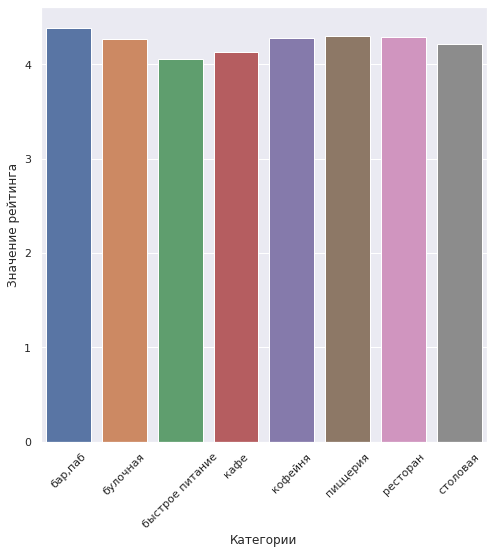

In [33]:
sns.barplot(data=data_rating, x='category', y='rat_mean')
plt.xlabel('Категории')
plt.ylabel('Значение рейтинга')
plt.xticks(rotation=45)
plt.show()

**Столбчатая диаграмма не показывает существенных различий в среднем рейтинге по категориям, для каждой категории средний рейтинг равен 4-ем или выше**

* **Отобразим на хороплете значения средних рейтингов по округам, для этого сгруппируем даннеые по округу и посчитаем для каждого среднее**

In [34]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


Впишем координаты Москвы и  сохраним json файл в переменную

In [35]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

In [36]:
map_mean_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

                                                                              
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(map_mean_rating)

               
map_mean_rating

**Хороплет говорит о том, что в центре столицы, средний рейтинг заведений больше, чем в остальных округах. На втором месте северный и северо-западный округ. Худший по оценкам округ - юго-запад.**

----

In [37]:
map_rest = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(map_rest)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

map_rest

* **Найдем топ 15 улиц по количеству заведений, сгруппируем по улицам, найдем количество записей, отсортируем по убыванию и оставим первые 15 значений**

In [38]:
streets_data = data.groupby('street', as_index=False).agg({'name': 'count'})
streets_data.columns=['street', 'cnt']
streets15 = streets_data.sort_values(by='cnt', ascending=False).head(15).reset_index(drop=True)

In [39]:
streets15

,street,cnt
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [40]:
streets_list = list(streets15['street'])
data_streets_15 = data.query('street in @streets_list')
data_streets_15 = data_streets_15.groupby(['street','category'], as_index=False)['name'].count()
data_streets_15.columns=['street', 'category', 'name_cnt']

In [41]:
fig = px.bar(data_streets_15, x='name_cnt', y='street', color='category',
             title='Количество заведений на топ-15 улицах',
             labels={
                     "street": "Улица",
                     "name_cnt": "Количество"})
fig.update_xaxes(tickangle=45)
fig.show() 

**Можем наблюдать, что подавляющее число заведений расположилось на Проспекте Мира. Последующие улицы идут друг от друга с небольшим разрывом по количеству заведений.**

----

* **Найдем улицы с одним заведением**

In [42]:
street_1 = data.groupby('street', as_index=False)['name'].count()
street_1 = street_1[street_1['name'] == 1]
street_1 = list(street_1['street'])
full_street_1 = data.query('street in @street_1')

In [43]:
street_1_grouped = full_street_1.groupby('district', as_index=False)['name'].count()
street_1_grouped.columns=['district', 'name']

In [44]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=street_1_grouped,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество заведений по районам',
).add_to(m)

               
m

**В ЦАО больше всего единственных на улице заведений**

In [45]:
street_1_category = full_street_1.groupby('category', as_index=False)['name'].count()

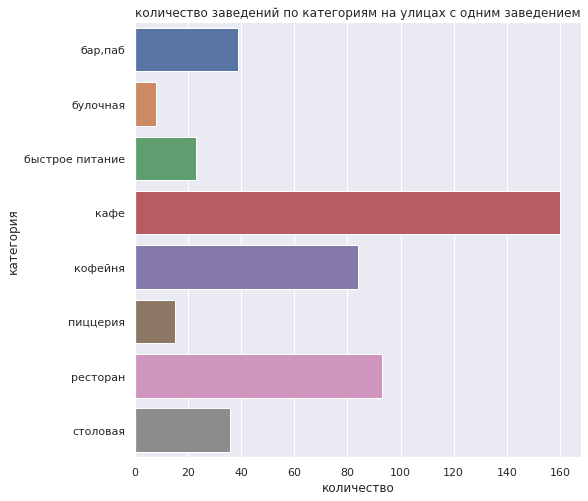

In [46]:
sns.barplot(data=street_1_category, x='name', y='category')
plt.title('количество заведений по категориям на улицах с одним заведением')
plt.xlabel('количество')
plt.ylabel('категория');

**Среди количества заведений по категориям на улицах с одним заведением, больше всех - кафе**

----

* **Сгруппируем данные по округам и найдем медианный средний чек**

In [47]:
avg_med = data.groupby('district', as_index=False)['middle_avg_bill'].median()
avg_med

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [48]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

                                                                              
Choropleth(
    geo_data=state_geo,
    data=avg_med,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная цена по району',
).add_to(m)

               
m

**График показывает, что самые большие рейтинги заведений в округах у ЦАО и ЗАО**

**Итог:**

* Самые популярные заведения в Москве это: рестораны, кафе и кофейни

* В топ 15 входят такие категории как: кафе, кофейни, рестораны, пиццерия и булочные

* После фильтрации по топ 15-ти заведениям и распределению количества по округам, видно, что у всех округов самая большая доля у кофеен. Но если смотреть на распределение в общем, то в каждом округе (кроме ЦАО), бОльшую долю занимают кафе.

* Существенной разницы в средних рейтингах по категориям нет. Но самый большой рейтинг у баров/пабов.

* В ЦАО гораздо больше заведений, чем в других округах

* ЦАО богат на рестораны, бары/пабы в отличии от других Округов

* Самый большой рейтинг по округам у ЦАО, самый низкий у Юго-западного округа.

* Самая загруженная по заведениям улица - Проспект Мира

* Среди количества заведений по категориям на улицах с одним заведением, больше всех - кафе

* Самая большая медиана по средним ценам, разбитая по округам - ЦАО И ЗАО. Меньшие - Северо-Восток, Юго-Восток, Юг.

# 5

**Нам известно, что заказчик хочет открыть кофейню и не боится конкуренции, а конкуренция в этой категории большая, ведь кофейни есть на каждом шагу. Считаю, что это не совсем верный подход, ведь "страх" конкуренции есть, как мне кажется, даже у мастадонтов бизнеса. Конкуренции можно не боятся только в том случае, если у вас достаточно финансов и вы четко проработали "запуск" (открытие заведения), рекламу (допустим в сетях), выкупили рекламу у лидеров мнений (блогеров), построили конструкцию лояльности к постоянным гостям или предлагаете нечто уникальное, например новую рецептуру, вкусы и тд. и еще много много других аспектов. Так или иначе, у нас слишком мало информации о заказчиках и их возможностях к старту, поэтому я бы провел более глубокое интервью с заказчиками.**

**Промежуточный вывод: Открыть такую же доступную и крутую кофейню как в сериале можно, вопрос в том, сколько вы готовы в это вложить**

**Так что предположим, что наша задача в том, чтобы:**

* Определить округ в котором стоит открыть кофейню, где таких заведений меньше всего. Или другими словами - поменьшить конкуренцию
* Понять какую установить среднюю цену на чашку 
* Определить в каком округе находятся кофейни с меньшим рейтингом, чтобы например учесть их ошибки из отзывов и выйти на рынок конкурентоспособными

**Отфильтруем данные по категории кофейня**

In [49]:
data_cofe = data[data['category'] == 'кофейня'].reset_index(drop=True)
data_cofe.shape

(1413, 16)

**Осталось 1413 заведений**

---

**Посмотрим распределение количества заведений по округам**

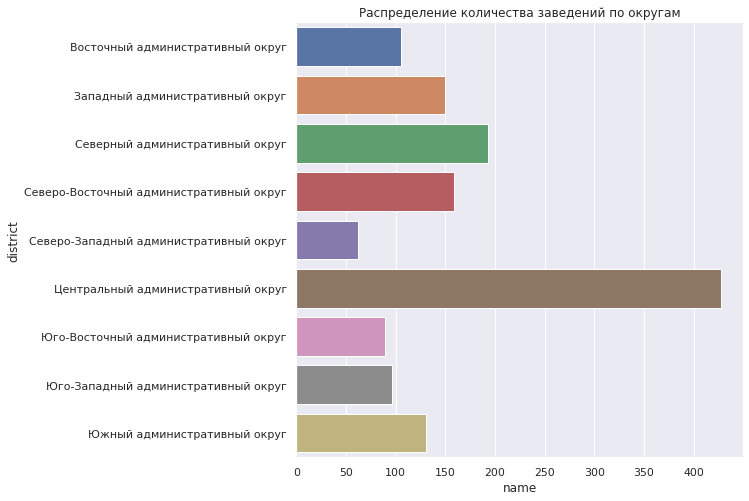

In [50]:
district_cofe = data_cofe.groupby('district',as_index=False)['name'].count()
plt.title('Распределение количества заведений по округам')
plt.xlabel('Количество')
plt.ylabel('Округ')
sns.barplot(data=district_cofe, x='name', y='district');

**Самый загруженный на кофейни округ - ЦАО. Самый маленький - Северо-Административный округ. Конкуренция в ЦАО очень большая. Считаю это не подходящим округом для открытия кофейни, она просто утонет в конкурентах. С точки зрения меньшей загруженности, можно взять на заметку: СЗАО, ЮВАО, ЮЗАО И ВАО**

In [51]:
district_cofe

,district,name
0,Восточный административный округ,105
1,Западный административный округ,150
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


---

**Проверим, есть ли кофейни работающие круглосуточно**

In [52]:
data_cofe[data_cofe['is_24/7'] == 'True'].shape

(0, 16)

**Круглосуточных кофеен нет. Результат логичный, спрос на кофе в основном утром или в разгар рабочего дня.**

---

**Построим распределенее средних рейтингов кофеен по округам**

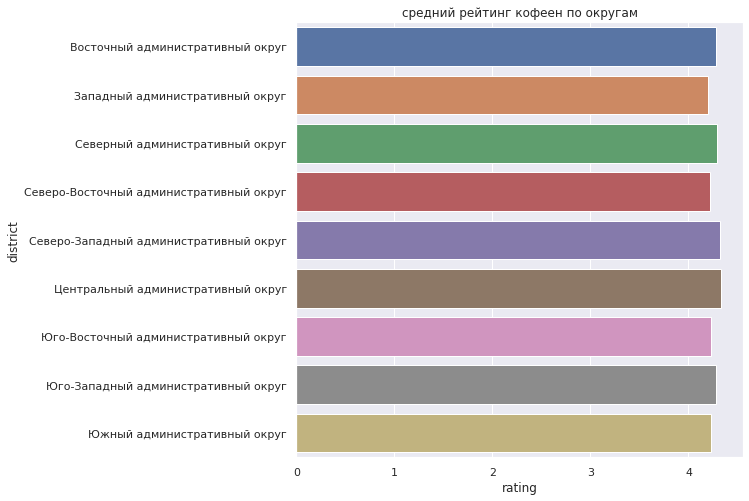

In [53]:
district_mean_rating = data_cofe.groupby('district',as_index=False)['rating'].mean()
plt.title('средний рейтинг кофеен по округам')
plt.xlabel('Рейтинг')
plt.ylabel('Округ')
sns.barplot(data=district_mean_rating, x='rating', y='district');

**Нет существенной разницы между средними рейтингами кофеен по округам**

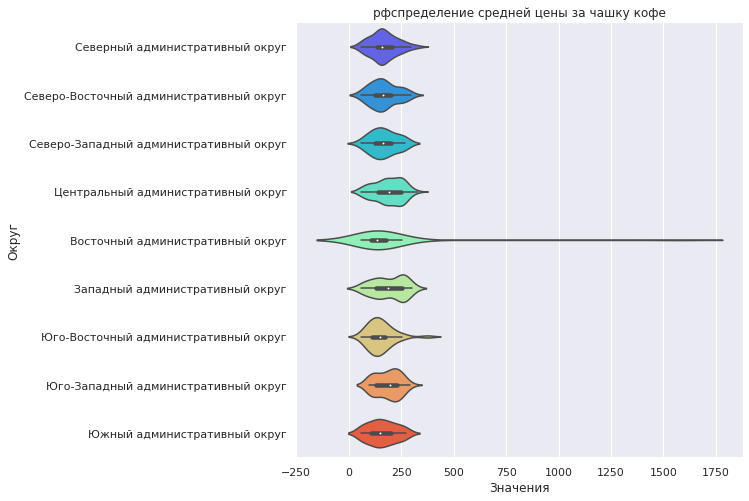

In [54]:
sns.violinplot(x='middle_coffee_cup', y='district', data=data_cofe, palette='rainbow')
plt.title('рфспределение средней цены за чашку кофе')
plt.xlabel('Значения')
plt.ylabel('Округ');

Видим выброс в ВАО.

In [55]:
data_cofe = data_cofe[data_cofe['middle_coffee_cup'] < 500]

----

**Найдем округленную среднюю цену чашки кофе**

In [56]:
round(data_cofe['middle_coffee_cup'].mean())

172

**Сгруппируем данные по округу и найдем среднюю цену за чашку кофе**

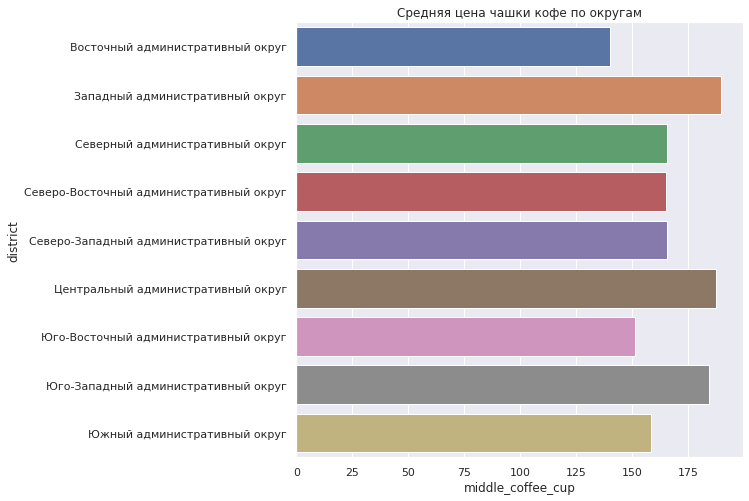

In [57]:
mean_cc = data_cofe.groupby('district',as_index=False)['middle_coffee_cup'].mean()
plt.title('Средняя цена чашки кофе по округам')
plt.xlabel('цена')
sns.barplot(data=mean_cc, x='middle_coffee_cup', y='district');

**Средняя цена чашки кофе больше всего в ЗАО, ЦАО И ЮЗАО. Самая маленькая на Юго-Востоке. В шаге, где мы вычисляли количество заведений по округу, мы выделили 4 района с наименьшей конкуренцией, это: СЗАО, ЮВАО, ЮЗАО И ВАО. На этом же графике мы можем наблюдать, что например ЮЗАО входит в топ-3 по средней цене за чашку.**

**И хоть ценообразование должно по логике исходить из: количества персонала, цены аренды помещения, прибавочной стоимости, чтобы не работать в убыток и прочих аспектов, предположим, что мы используем цену как инструмент привлечения и удержания потребителей.**

**Вывод:**

**Для открытия кофейни на примете у нас остался один округ - ЮЗАО. Этот округ имеет малую загруженность в сегменте кофейни и при этом, в среднем, цена за чашку кофе высокая по отношению к другим районам. Предлагаю открыть кофейню в ЮЗАО, предварительно, рассчитав все так, чтобы цена за чашку была меньше средней по округу**